### Imported Libraries and Constants:

In [1]:
import cv2
import os
import numpy as np
import pandas as pd
import random

import matplotlib.pyplot as plt
import matplotlib.image as mpimg


import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import array_to_img, img_to_array, load_img, to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from scikeras.wrappers import KerasClassifier

from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, roc_curve, auc

import types
import pickle


##### constants:

In [2]:
img_height = 100
img_width = 100
num_classes = 84

### Load Data

In [3]:
def resize_without_squeezing(image, target_size):
    h, w = image.shape[:2]
    aspect_ratio = w / h

    # Calculate new size while preserving aspect ratio
    if aspect_ratio > 1:
        new_w = target_size
        new_h = int(target_size / aspect_ratio)
    else:
        new_h = target_size
        new_w = int(target_size * aspect_ratio)

    # Resize the image
    resized_img = cv2.resize(image, (new_w, new_h))

    # Create a canvas with the target size and fill with padding color
    canvas = np.full((target_size, target_size, 3), (255,255,255), dtype=np.uint8)

    # Calculate the position to paste the resized image in the center
    y_offset = (target_size - new_h) // 2
    x_offset = (target_size - new_w) // 2

    # Paste the resized image onto the canvas
    canvas[y_offset:y_offset + new_h, x_offset:x_offset + new_w] = resized_img

    return canvas

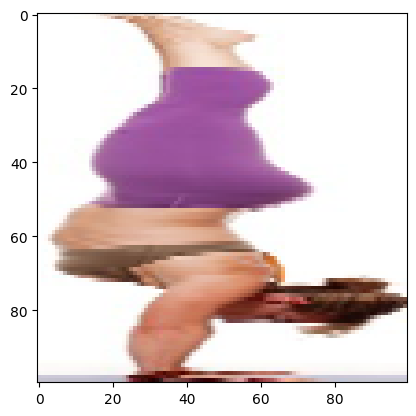

In [12]:
img = cv2.imread("../data/dataset/adho mukha vrksasana/52-0.png")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
img = cv2.resize(img, (100, 100))
plt.imshow(img)
plt.savefig('../images/canva3.png')
#plt.show()


<Figure size 640x480 with 0 Axes>

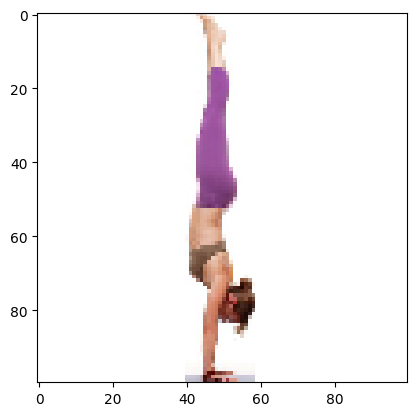

In [11]:
img = cv2.imread("../data/dataset/adho mukha vrksasana/52-0.png")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
img = resize_without_squeezing(img,img_height)
plt.imshow(img)
plt.savefig('../images/canva2.png')
#plt.show()

In [7]:
def get_folders_in_directory(directory_path):
    # Get the list of all files and folders in the specified directory
    items = os.listdir(directory_path)
    # Filter out only the folders from the list
    folders = [item for item in items if os.path.isdir(os.path.join(directory_path, item))]
    return folders
    
def load_images_from_folder(folder):
    # Function to load and preprocess images from a folder
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, filename))
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
            img = resize_without_squeezing(img,img_height)
            #img = cv2.resize(img, (img_height, img_width))
            images.append(img)
    return images



base_dir = '../data/dataset'
labels_name = get_folders_in_directory(base_dir) # get the list of folder names
labels_dict = {label:i for i,label in enumerate(labels_name)} # assign an int for each folder name = asana

# Get all images and corresp labels
all_images=[]
all_labels=[]
for label in labels_name:
    new_images = load_images_from_folder(base_dir+'/'+label)
    all_images = all_images + new_images
    for i in range(len(new_images)):
        all_labels.append(labels_dict[label])

# Ensure that all_image_paths and all_labels are numpy arrays for easier manipulation
images = np.array(all_images)/255 # normalize images to the range [0-1]
labels = np.array(all_labels)

# Shuffle indices
indices = np.arange(len(images))
np.random.shuffle(indices)

# Use the shuffled indices to reorder X and y
images_shuffled = images[indices]
labels_shuffled = labels[indices]

images = images_shuffled
labels = labels_shuffled

#images = images.reshape(images.shape[0], -1)

print("images data shape: ", images.shape)
print("labels data shape: ", labels.shape)

images data shape:  (4978, 100, 100, 3)
labels data shape:  (4978,)


In [3]:
'''
img = images[700]
plt.imshow(img)
plt.show()
'''

'\nimg = images[700]\nplt.imshow(img)\nplt.show()\n'

### Split Data into train, validation, and test sets

In [8]:
# SPLITTING 1
'''
# Split the dataset into training and temporary sets (combined validation and test)
train_data, temp_data, train_labels, temp_labels = train_test_split(
    images, labels, test_size=0.3, random_state=42
)

# Split the temporary set into validation and test sets
val_data, test_data, val_labels, test_labels = train_test_split(
    temp_data, temp_labels, test_size=0.5, random_state=42
)
'''

In [5]:
# SPLITTING 2
# Split the dataset into training and test sets
train_data, test_data, train_labels, test_labels = train_test_split(
    images, labels, test_size=0.2, random_state=42
)

In [6]:
from tensorflow.keras.utils import to_categorical

# For multi-class classification
train_labels_one_hot = to_categorical(train_labels, num_classes=num_classes)
#val_labels_one_hot = to_categorical(val_labels, num_classes=num_classes)
test_labels_one_hot = to_categorical(test_labels, num_classes=num_classes)

### Inicialize ImageDataGenerator

In [8]:
'''
# Create an ImageDataGenerator for data augmentation
def add_noise(img):
    #Add random noise to an image
    VARIABILITY = 50
    deviation = VARIABILITY*random.random()
    noise = np.random.normal(0, deviation, img.shape)
    new_img = img + noise
    np.clip(new_img, 0., 255.)
    return new_img
'''

# Initialising the ImageDataGenerator class.
# We will pass in the augmentation parameters in the constructor.
datagen = ImageDataGenerator(
        rotation_range = 30,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip = True
        #preprocessing_function=add_noise
)

### Create Model

In [9]:
def compile_model(model, optimizer, metrics):
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=metrics)
    return model

##### CNN

In [7]:
def create_CNN():
    model = keras.Sequential([
        layers.Conv2D(16, (3, 3), padding='same', activation='relu'),
        layers.MaxPooling2D(2, 2),
        layers.Dropout(0.2), #to avoid overfitting
        
        layers.Conv2D(32, (3, 3), padding='same',  activation='relu'),
        layers.MaxPooling2D(2, 2),
        layers.Dropout(0.2),
        
        layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
        layers.MaxPooling2D(2, 2),
        layers.Dropout(0.2),
        
        layers.Flatten(),
        #layers.Dense(512, activation='relu'), #prova anche 256 e 1024
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation='softmax') 
    ])
    
    return model

##### ResNet

In [11]:
class ResidualBlock(tf.keras.layers.Layer):
    def __init__(self, filters, kernel_size=3, stride=1):
        super(ResidualBlock, self).__init__()
        self.conv1 = layers.Conv2D(filters, kernel_size, strides=stride, padding='same', use_bias=False)
        self.bn1 = layers.BatchNormalization()
        self.relu = layers.Activation('relu')
        self.dropout = layers.Dropout(0.25)
        self.conv2 = layers.Conv2D(filters, kernel_size, strides=1, padding='same', use_bias=False)
        self.bn2 = layers.BatchNormalization()
        self.downsample = None

        # Adding a shortcut/skip connection if dimensions change
        if stride != 1:
            self.downsample = tf.keras.Sequential([
                layers.Conv2D(filters, 1, strides=stride, use_bias=False),
                layers.BatchNormalization()
            ])

    def call(self, inputs, training=False):
        residual = inputs

        x = self.conv1(inputs)
        x = self.bn1(x, training=training)
        x = self.relu(x)

        x = self.conv2(x)
        x = self.bn2(x, training=training)

        # Adding the skip connection if present
        if self.downsample is not None:
            residual = self.downsample(residual)

        x += residual
        x = self.relu(x)

        return x

class ResNet(tf.keras.Model):
    def __init__(self, num_classes):
        super(ResNet, self).__init__()
        self.conv1 = layers.Conv2D(64, 3, strides=2, padding='same', use_bias=False)
        self.bn1 = layers.BatchNormalization()
        self.relu = layers.Activation('relu')
        self.pool1 = layers.MaxPooling2D(pool_size=3, strides=2, padding='same')

        self.block1 = ResidualBlock(64)
        self.block2 = ResidualBlock(64)
        

        self.global_avg_pooling = layers.GlobalAveragePooling2D()
        self.fc = layers.Dense(num_classes, activation='softmax')

    
    def call(self, inputs, training=False):
        x = self.conv1(inputs)
        x = self.bn1(x, training=training)
        x = self.relu(x)
        x = self.pool1(x)

        x = self.block1(x, training=training)
        x = self.block2(x, training=training)
        # Add more blocks as needed...

        x = self.global_avg_pooling(x)
        output = self.fc(x)

        return output

In [16]:
# Create an instance of the ResNet model
num_classes = 106  # Set the number of classes based on your task
resnet_model = ResNet(num_classes)

##### DenseNet121

In [8]:
def create_DN():
    ptrain_model = tf.keras.applications.DenseNet121(input_shape=(img_height,img_width,3),
                                                      include_top=False,
                                                      weights='imagenet',
                                                      pooling='avg')
    ptrain_model.trainable = False
    
    inputs = ptrain_model.input

    # Trying different configurations, such as [512, 256], [256, 128], etc., could be beneficial.
    drop_layer = tf.keras.layers.Dropout(0.25)(ptrain_model.output)
    x_layer = tf.keras.layers.Dense(512, activation='relu')(drop_layer)
    x_layer1 = tf.keras.layers.Dense(128, activation='relu')(x_layer)
    drop_layer1 = tf.keras.layers.Dropout(0.20)(x_layer1)
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(drop_layer1)
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
                  
    return model 

In [9]:
def create_DN2():
    # adding BatchNormalization
    ptrain_model = tf.keras.applications.DenseNet121(input_shape=(img_height,img_width,3),
                                                      include_top=False,
                                                      weights='imagenet',
                                                      pooling='avg')
    ptrain_model.trainable = False
    
    inputs = ptrain_model.input

    # Trying different configurations, such as [512, 256], [256, 128], etc., could be beneficial.
    drop_layer = tf.keras.layers.Dropout(0.25)(ptrain_model.output)
    x_layer = tf.keras.layers.Dense(512, activation='relu')(drop_layer)
    x_layer = tf.keras.layers.BatchNormalization()(x_layer)
    
    x_layer1 = tf.keras.layers.Dense(256, activation='relu')(x_layer)
    x_layer1 = tf.keras.layers.BatchNormalization()(x_layer1)
    
    drop_layer1 = tf.keras.layers.Dropout(0.20)(x_layer1)
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(drop_layer1)
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
                  
    return model 

In [10]:
def create_DN3():
    # adding BatchNormalization
    ptrain_model = tf.keras.applications.DenseNet121(input_shape=(img_height,img_width,3),
                                                      include_top=False,
                                                      weights='imagenet',
                                                      pooling='avg')
    ptrain_model.trainable = False
    
    inputs = ptrain_model.input

    # Trying different configurations, such as [512, 256], [256, 128], etc., could be beneficial.
    drop_layer = tf.keras.layers.Dropout(0.25)(ptrain_model.output)
    x_layer = tf.keras.layers.Dense(512, activation='relu')(drop_layer)
    x_layer = tf.keras.layers.BatchNormalization()(x_layer)
    
    x_layer1 = tf.keras.layers.Dense(256, activation='relu')(x_layer)
    x_layer1 = tf.keras.layers.BatchNormalization()(x_layer1)

    x_layer2 = tf.keras.layers.Dense(128, activation='relu')(x_layer1)
    x_layer2 = tf.keras.layers.BatchNormalization()(x_layer2)
    
    drop_layer1 = tf.keras.layers.Dropout(0.20)(x_layer2)
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(drop_layer1)
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
                  
    return model 

### Train Model

In [ ]:
# Train the model with data augmentation
batch_size = 16 # number of training examples utilized in one iteration
num_epochs = 10 # number of iteration
es = EarlyStopping(monitor='val_accuracy', mode='max', min_delta=1, verbose=1, patience = 4)

# Use flow for the training set
train_datagen = datagen.flow(train_data, train_labels_one_hot, batch_size=batch_size)
# Use flow for the validation set
#val_datagen = datagen.flow(val_data, val_labels_one_hot, batch_size=batch_size)

# Train the model with data augmentation
history = model.fit(train_datagen, epochs=num_epochs, validation_split=0.3, callback=[es])


# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(test_data, test_labels_one_hot)
print(f'Test accuracy: {test_acc}')

plt.plot(history.history['accuracy'],label='train')
plt.plot(history.history['val_accuracy'], labek='test')
plt.show

In [31]:
#model.summary()

#### CNN

In [12]:
batch_size = 32
num_epochs = 30
# image_size = 100x100
# no noise added
# optimizer: adam
# without layers.Dense(512, activation='relu')

train_datagen = datagen.flow(train_data, train_labels_one_hot, batch_size=batch_size)
val_datagen = datagen.flow(val_data, val_labels_one_hot, batch_size=batch_size)
history = model.fit(train_datagen, epochs=num_epochs, validation_data=val_datagen)
test_loss, test_acc = model.evaluate(test_data, test_labels_one_hot)
print(f'Test accuracy: {test_acc}')

Epoch 1/30


150/150 [==============================] - 15s 87ms/step - loss: 4.6670 - accuracy: 0.0165 - val_loss: 4.6228 - val_accuracy: 0.0134
Epoch 2/30
150/150 [==============================] - 13s 87ms/step - loss: 4.4801 - accuracy: 0.0353 - val_loss: 4.4190 - val_accuracy: 0.0568
Epoch 3/30
150/150 [==============================] - 13s 87ms/step - loss: 4.2858 - accuracy: 0.0515 - val_loss: 4.2472 - val_accuracy: 0.0618
Epoch 4/30
150/150 [==============================] - 13s 89ms/step - loss: 4.1805 - accuracy: 0.0588 - val_loss: 4.1744 - val_accuracy: 0.0634
Epoch 5/30
150/150 [==============================] - 13s 87ms/step - loss: 4.0941 - accuracy: 0.0693 - val_loss: 4.1014 - val_accuracy: 0.0801
Epoch 6/30
150/150 [==============================] - 13s 87ms/step - loss: 4.0078 - accuracy: 0.0778 - val_loss: 4.0124 - val_accuracy: 0.0902
Epoch 7/30
150/150 [==============================] - 13s 87ms/step - loss: 3.9541 - accuracy: 0.0914 - val_loss: 3.9391 - val_accurac

In [24]:
batch_size = 32
num_epochs = 30
# image_size = 100x100
# no noise added
# optimizer: rmsprop
# without layers.Dense(512, activation='relu')

train_datagen = datagen.flow(train_data, train_labels_one_hot, batch_size=batch_size)
val_datagen = datagen.flow(val_data, val_labels_one_hot, batch_size=batch_size)
history = model.fit(train_datagen, epochs=num_epochs, validation_data=val_datagen)

Epoch 1/30
150/150 [==============================] - 14s 85ms/step - loss: 4.6436 - accuracy: 0.0169 - val_loss: 4.5404 - val_accuracy: 0.0267
Epoch 2/30
150/150 [==============================] - 13s 83ms/step - loss: 4.4024 - accuracy: 0.0390 - val_loss: 4.3252 - val_accuracy: 0.0434
Epoch 3/30
150/150 [==============================] - 13s 86ms/step - loss: 4.2708 - accuracy: 0.0469 - val_loss: 4.2310 - val_accuracy: 0.0601
Epoch 4/30
150/150 [==============================] - 13s 84ms/step - loss: 4.1826 - accuracy: 0.0574 - val_loss: 4.1810 - val_accuracy: 0.0668
Epoch 5/30
150/150 [==============================] - 13s 84ms/step - loss: 4.1232 - accuracy: 0.0649 - val_loss: 4.1243 - val_accuracy: 0.0902
Epoch 6/30
150/150 [==============================] - 13s 84ms/step - loss: 4.0562 - accuracy: 0.0741 - val_loss: 4.1052 - val_accuracy: 0.0785
Epoch 7/30
150/150 [==============================] - 13s 84ms/step - loss: 3.9955 - accuracy: 0.0864 - val_loss: 4.0167 - val_accuracy:

In [25]:
test_loss, test_acc = model.evaluate(test_data, test_labels_one_hot)
print(f'Test accuracy: {test_acc}')

19/19 [==============================] - 0s 14ms/step - loss: 2.9677 - accuracy: 0.2833
Test accuracy: 0.28333333134651184


#### RESNET

In [18]:
batch_size = 32
num_epochs = 30 
# image_size = 100x100
# no noise added
# optimizer: adam

train_datagen = datagen.flow(train_data, train_labels_one_hot, batch_size=batch_size)
val_datagen = datagen.flow(val_data, val_labels_one_hot, batch_size=batch_size)
history = resnet_model.fit(train_datagen, epochs=num_epochs, validation_data=val_datagen)
test_loss, test_acc = resnet_model.evaluate(test_data, test_labels_one_hot)
print(f'Test accuracy: {test_acc}')

Epoch 1/30
150/150 [==============================] - 21s 129ms/step - loss: 4.5829 - accuracy: 0.0292 - val_loss: 5.4102 - val_accuracy: 0.0117
Epoch 2/30
150/150 [==============================] - 20s 130ms/step - loss: 4.2674 - accuracy: 0.0465 - val_loss: 5.4436 - val_accuracy: 0.0134
Epoch 3/30
150/150 [==============================] - 20s 134ms/step - loss: 4.1130 - accuracy: 0.0488 - val_loss: 7.7326 - val_accuracy: 0.0184
Epoch 4/30
150/150 [==============================] - 21s 138ms/step - loss: 4.0074 - accuracy: 0.0620 - val_loss: 6.1084 - val_accuracy: 0.0250
Epoch 5/30
150/150 [==============================] - 22s 148ms/step - loss: 3.9432 - accuracy: 0.0670 - val_loss: 4.1867 - val_accuracy: 0.0501
Epoch 6/30
150/150 [==============================] - 21s 142ms/step - loss: 3.8879 - accuracy: 0.0784 - val_loss: 5.6141 - val_accuracy: 0.0134
Epoch 7/30
150/150 [==============================] - 21s 141ms/step - loss: 3.8366 - accuracy: 0.0841 - val_loss: 7.9083 - val_ac

In [13]:
batch_size = 32
num_epochs = 30 
# image_size = 100x100
# no noise added
# optimizer: rmsprop

train_datagen = datagen.flow(train_data, train_labels_one_hot, batch_size=batch_size)
val_datagen = datagen.flow(val_data, val_labels_one_hot, batch_size=batch_size)
history = resnet_model.fit(train_datagen, epochs=num_epochs, validation_data=val_datagen)
test_loss, test_acc = resnet_model.evaluate(test_data, test_labels_one_hot)
print(f'Test accuracy: {test_acc}')

Epoch 1/30


150/150 [==============================] - 22s 135ms/step - loss: 4.5804 - accuracy: 0.0257 - val_loss: 5.4785 - val_accuracy: 0.0200
Epoch 2/30
150/150 [==============================] - 21s 136ms/step - loss: 4.2501 - accuracy: 0.0482 - val_loss: 6.3911 - val_accuracy: 0.0217
Epoch 3/30
150/150 [==============================] - 21s 138ms/step - loss: 4.0890 - accuracy: 0.0570 - val_loss: 4.9307 - val_accuracy: 0.0267
Epoch 4/30
150/150 [==============================] - 23s 150ms/step - loss: 3.9878 - accuracy: 0.0672 - val_loss: 7.3067 - val_accuracy: 0.0184
Epoch 5/30
150/150 [==============================] - 21s 137ms/step - loss: 3.9121 - accuracy: 0.0770 - val_loss: 5.5572 - val_accuracy: 0.0200
Epoch 6/30
150/150 [==============================] - 22s 143ms/step - loss: 3.8564 - accuracy: 0.0874 - val_loss: 4.6914 - val_accuracy: 0.0334
Epoch 7/30
150/150 [==============================] - 22s 145ms/step - loss: 3.8021 - accuracy: 0.0935 - val_loss: 4.7797 - val_

#### DenseSet

In [25]:
batch_size = 32
num_epochs = 30 
# image_size = 100x100
# no noise added
# optimizer: adam

train_datagen = datagen.flow(train_data, train_labels_one_hot, batch_size=batch_size)
val_datagen = datagen.flow(val_data, val_labels_one_hot, batch_size=batch_size)
history = model.fit(train_datagen, epochs=num_epochs, validation_data=val_datagen)
test_loss, test_acc = model.evaluate(test_data, test_labels_one_hot)
print(f'Test accuracy: {test_acc}')

Epoch 1/30
150/150 [==============================] - 51s 298ms/step - loss: 4.6963 - accuracy: 0.0142 - val_loss: 4.5425 - val_accuracy: 0.0250
Epoch 2/30
150/150 [==============================] - 47s 308ms/step - loss: 4.4214 - accuracy: 0.0388 - val_loss: 4.1213 - val_accuracy: 0.0684
Epoch 3/30
150/150 [==============================] - 46s 309ms/step - loss: 4.0352 - accuracy: 0.0753 - val_loss: 3.6939 - val_accuracy: 0.1085
Epoch 4/30
150/150 [==============================] - 42s 279ms/step - loss: 3.7361 - accuracy: 0.0991 - val_loss: 3.4252 - val_accuracy: 0.1436
Epoch 5/30
150/150 [==============================] - 43s 287ms/step - loss: 3.5636 - accuracy: 0.1258 - val_loss: 3.3379 - val_accuracy: 0.1770
Epoch 6/30
150/150 [==============================] - 45s 297ms/step - loss: 3.3902 - accuracy: 0.1496 - val_loss: 3.1710 - val_accuracy: 0.1836
Epoch 7/30
150/150 [==============================] - 45s 302ms/step - loss: 3.2736 - accuracy: 0.1707 - val_loss: 3.0279 - val_ac

### Compare Models and parameters

In [11]:
# SPLITTING 
# Split the dataset into training and temporary sets (combined validation and test)
train_data, temp_data, train_labels, temp_labels = train_test_split(
    images, labels, test_size=0.3, random_state=42
)

# Split the temporary set into validation and test sets
val_data, test_data, val_labels, test_labels = train_test_split(
    temp_data, temp_labels, test_size=0.5, random_state=42
)

train_labels_one_hot = to_categorical(train_labels, num_classes=num_classes)
val_labels_one_hot = to_categorical(val_labels, num_classes=num_classes)
test_labels_one_hot = to_categorical(test_labels, num_classes=num_classes)

In [13]:
def save_model(model):
    model_file = '../models/param_iteration_dn3.pkl'
    with open(model_file, 'wb') as f:
        pickle.dump(model, f)

In [14]:
def train_model(train_data, val_data, test_data, train_labels_one_hot, val_labels_one_hot, test_labels_one_hot, model_type, optimizer, batch_size, num_epochs, metrics=['accuracy']):

    result_dict = {}
    result_dict["optimizer"] = optimizer
    result_dict["num_epochs"] = num_epochs
    result_dict["batch_size"] = batch_size
   
    if model_type == 'CNN':
        model = create_CNN()
    elif model_type == 'DenseNet':
        model = create_DN3()
        
    # optimizer
    initial_learning_rate = 0.001
    lr_schedule = keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate, decay_steps=10000, decay_rate=0.9, staircase=True)
    if optimizer=='adam':
        opt = keras.optimizers.Adam(learning_rate=lr_schedule)
    elif optimizer=='rmsprop':
        opt = keras.optimizers.RMSprop(learning_rate=lr_schedule)
    elif optimizer=='SGD':
        opt = keras.optimizers.SGD(learning_rate=lr_schedule)

    # compile model
    model = compile_model(model, opt, metrics)

    # train model
    early_stopping = EarlyStopping(monitor='val_accuracy', mode='max', min_delta=0.001, verbose=1, patience = 5, restore_best_weights=True)

    train_datagen = datagen.flow(train_data, train_labels_one_hot, batch_size=batch_size)
    val_datagen = datagen.flow(val_data, val_labels_one_hot, batch_size=batch_size)
    history = model.fit(train_datagen, epochs=num_epochs, callbacks=[early_stopping], validation_data=val_datagen)

    # Evaluate the model on the test set
    test_loss, test_acc = model.evaluate(test_data, test_labels_one_hot)
    print(f'Test accuracy: {test_acc}')

    result_dict["actual_num_epochs"] = len(history.history['loss'])
    result_dict["accuracy"] = test_acc
    return result_dict, model

In [15]:
param_grid = {
    'epochs' : [30,50],
    'batch_size': [8,16,32],
    'optimizer': ['adam','rmsprop']
}

##### CNN

In [13]:
results = []
i=0
best_accuracy = (-1,0)

for n_ep in param_grid['epochs']:
    for b_size in param_grid["batch_size"]:
        for opt in param_grid['optimizer']:
            print(f"number of epochs: {n_ep}, batch size: {b_size}, optimizer: {opt}")
            d, model = train_model(train_data, val_data, test_data, train_labels_one_hot, val_labels_one_hot, test_labels_one_hot, 
                            'CNN', opt, b_size, n_ep, metrics=['accuracy'])
            results.append(d)
            if d["accuracy"] > best_accuracy[1]:
                best_accuracy = (i,d["accuracy"])
                save_model(model)
            i+=1            

number of epochs: 30, batch size: 8, optimizer: adam


Epoch 1/30


470/470 [==============================] - 18s 34ms/step - loss: 4.6535 - accuracy: 0.0139 - val_loss: 4.6348 - val_accuracy: 0.0149
Epoch 2/30
470/470 [==============================] - 15s 31ms/step - loss: 4.6105 - accuracy: 0.0200 - val_loss: 4.5720 - val_accuracy: 0.0174
Epoch 3/30
470/470 [==============================] - 14s 30ms/step - loss: 4.5064 - accuracy: 0.0301 - val_loss: 4.4574 - val_accuracy: 0.0286
Epoch 4/30
470/470 [==============================] - 14s 30ms/step - loss: 4.3555 - accuracy: 0.0453 - val_loss: 4.3121 - val_accuracy: 0.0485
Epoch 5/30
470/470 [==============================] - 14s 30ms/step - loss: 4.2475 - accuracy: 0.0535 - val_loss: 4.2490 - val_accuracy: 0.0560
Epoch 6/30
470/470 [==============================] - 14s 30ms/step - loss: 4.1664 - accuracy: 0.0602 - val_loss: 4.1512 - val_accuracy: 0.0697
Epoch 7/30
470/470 [==============================] - 14s 30ms/step - loss: 4.1

INFO:tensorflow:Assets written to: C:\Users\lucia\AppData\Local\Temp\tmpu2p94d7e\assets


number of epochs: 30, batch size: 8, optimizer: rmsprop
Epoch 1/30
470/470 [==============================] - 13s 27ms/step - loss: 4.6374 - accuracy: 0.0157 - val_loss: 4.5771 - val_accuracy: 0.0299
Epoch 2/30
470/470 [==============================] - 18s 39ms/step - loss: 4.4538 - accuracy: 0.0400 - val_loss: 4.3138 - val_accuracy: 0.0498
Epoch 3/30
470/470 [==============================] - 22s 47ms/step - loss: 4.2698 - accuracy: 0.0530 - val_loss: 4.2365 - val_accuracy: 0.0423
Epoch 4/30
470/470 [==============================] - 19s 41ms/step - loss: 4.1692 - accuracy: 0.0637 - val_loss: 4.1617 - val_accuracy: 0.0597
Epoch 5/30
470/470 [==============================] - 22s 47ms/step - loss: 4.1023 - accuracy: 0.0767 - val_loss: 4.0652 - val_accuracy: 0.0808
Epoch 6/30
470/470 [==============================] - 20s 42ms/step - loss: 4.0686 - accuracy: 0.0733 - val_loss: 4.2476 - val_accuracy: 0.0572
Epoch 7/30
470/470 [==============================] - 19s 41ms/step - loss: 4.02

INFO:tensorflow:Assets written to: C:\Users\lucia\AppData\Local\Temp\tmpuh635bry\assets


number of epochs: 30, batch size: 16, optimizer: rmsprop
Epoch 1/30
235/235 [==============================] - 14s 58ms/step - loss: 4.6154 - accuracy: 0.0184 - val_loss: 4.4875 - val_accuracy: 0.0274
Epoch 2/30
235/235 [==============================] - 11s 45ms/step - loss: 4.3791 - accuracy: 0.0445 - val_loss: 4.2980 - val_accuracy: 0.0522
Epoch 3/30
235/235 [==============================] - 15s 63ms/step - loss: 4.2419 - accuracy: 0.0506 - val_loss: 4.2234 - val_accuracy: 0.0510
Epoch 4/30
235/235 [==============================] - 14s 60ms/step - loss: 4.1615 - accuracy: 0.0575 - val_loss: 4.1646 - val_accuracy: 0.0547
Epoch 5/30
235/235 [==============================] - 10s 44ms/step - loss: 4.0542 - accuracy: 0.0733 - val_loss: 4.0913 - val_accuracy: 0.0721
Epoch 6/30
235/235 [==============================] - 11s 45ms/step - loss: 4.0102 - accuracy: 0.0775 - val_loss: 4.0403 - val_accuracy: 0.0846
Epoch 7/30
235/235 [==============================] - 11s 45ms/step - loss: 3.9

INFO:tensorflow:Assets written to: C:\Users\lucia\AppData\Local\Temp\tmprajh99sh\assets


number of epochs: 30, batch size: 32, optimizer: adam
Epoch 1/30
118/118 [==============================] - 11s 87ms/step - loss: 4.6647 - accuracy: 0.0147 - val_loss: 4.6317 - val_accuracy: 0.0149
Epoch 2/30
118/118 [==============================] - 10s 84ms/step - loss: 4.6143 - accuracy: 0.0184 - val_loss: 4.6144 - val_accuracy: 0.0224
Epoch 3/30
118/118 [==============================] - 10s 84ms/step - loss: 4.5151 - accuracy: 0.0317 - val_loss: 4.4706 - val_accuracy: 0.0473
Epoch 4/30
118/118 [==============================] - 10s 85ms/step - loss: 4.3326 - accuracy: 0.0413 - val_loss: 4.2947 - val_accuracy: 0.0485
Epoch 5/30
118/118 [==============================] - 10s 85ms/step - loss: 4.2108 - accuracy: 0.0479 - val_loss: 4.2354 - val_accuracy: 0.0585
Epoch 6/30
118/118 [==============================] - 10s 85ms/step - loss: 4.1505 - accuracy: 0.0597 - val_loss: 4.2241 - val_accuracy: 0.0634
Epoch 7/30
118/118 [==============================] - 10s 84ms/step - loss: 4.0872

INFO:tensorflow:Assets written to: C:\Users\lucia\AppData\Local\Temp\tmpvm1cak56\assets


number of epochs: 50, batch size: 16, optimizer: rmsprop
Epoch 1/50
235/235 [==============================] - 11s 45ms/step - loss: 4.6322 - accuracy: 0.0168 - val_loss: 4.5848 - val_accuracy: 0.0410
Epoch 2/50
235/235 [==============================] - 10s 44ms/step - loss: 4.4571 - accuracy: 0.0376 - val_loss: 4.3750 - val_accuracy: 0.0435
Epoch 3/50
235/235 [==============================] - 11s 46ms/step - loss: 4.2931 - accuracy: 0.0493 - val_loss: 4.2468 - val_accuracy: 0.0485
Epoch 4/50
235/235 [==============================] - 11s 45ms/step - loss: 4.1753 - accuracy: 0.0522 - val_loss: 4.2416 - val_accuracy: 0.0597
Epoch 5/50
235/235 [==============================] - 10s 44ms/step - loss: 4.1040 - accuracy: 0.0674 - val_loss: 4.1722 - val_accuracy: 0.0522
Epoch 6/50
235/235 [==============================] - 10s 44ms/step - loss: 4.0774 - accuracy: 0.0703 - val_loss: 4.1131 - val_accuracy: 0.0721
Epoch 7/50
235/235 [==============================] - 10s 45ms/step - loss: 4.0

##### DenseNest1

In [17]:
results = []
i=0
best_accuracy = (-1,0)

for n_ep in param_grid['epochs']:
    for b_size in param_grid["batch_size"]:
        for opt in param_grid['optimizer']:
            print(f"number of epochs: {n_ep}, batch size: {b_size}, optimizer: {opt}")
            d, model = train_model(train_data, val_data, test_data, train_labels_one_hot, val_labels_one_hot, test_labels_one_hot, 
                            'DenseNet', opt, b_size, n_ep, metrics=['accuracy'])
            results.append(d)
            if d["accuracy"] > best_accuracy[1]:
                best_accuracy = (i,d["accuracy"])
                save_model(model)
            i+=1     

number of epochs: 30, batch size: 8, optimizer: adam
Epoch 1/30
470/470 [==============================] - 53s 100ms/step - loss: 4.6678 - accuracy: 0.0173 - val_loss: 4.5765 - val_accuracy: 0.0187
Epoch 2/30
470/470 [==============================] - 45s 97ms/step - loss: 4.4873 - accuracy: 0.0301 - val_loss: 4.3554 - val_accuracy: 0.0435
Epoch 3/30
470/470 [==============================] - 45s 97ms/step - loss: 4.3292 - accuracy: 0.0325 - val_loss: 4.1425 - val_accuracy: 0.0311
Epoch 4/30
470/470 [==============================] - 45s 97ms/step - loss: 4.0968 - accuracy: 0.0506 - val_loss: 3.8716 - val_accuracy: 0.0535
Epoch 5/30
470/470 [==============================] - 45s 96ms/step - loss: 3.9582 - accuracy: 0.0538 - val_loss: 3.7851 - val_accuracy: 0.0734
Epoch 6/30
470/470 [==============================] - 46s 97ms/step - loss: 3.8399 - accuracy: 0.0722 - val_loss: 3.6497 - val_accuracy: 0.0945
Epoch 7/30
470/470 [==============================] - 45s 96ms/step - loss: 3.7806

INFO:tensorflow:Assets written to: C:\Users\lucia\AppData\Local\Temp\tmplgk2dpxm\assets


number of epochs: 30, batch size: 8, optimizer: rmsprop
Epoch 1/30
470/470 [==============================] - 62s 110ms/step - loss: 4.6326 - accuracy: 0.0226 - val_loss: 4.3705 - val_accuracy: 0.0398
Epoch 2/30
470/470 [==============================] - 49s 105ms/step - loss: 4.2557 - accuracy: 0.0618 - val_loss: 3.9769 - val_accuracy: 0.0721
Epoch 3/30
470/470 [==============================] - 47s 101ms/step - loss: 3.9282 - accuracy: 0.0876 - val_loss: 3.7201 - val_accuracy: 0.0983
Epoch 4/30
470/470 [==============================] - 47s 100ms/step - loss: 3.6766 - accuracy: 0.1095 - val_loss: 3.4986 - val_accuracy: 0.1704
Epoch 5/30
470/470 [==============================] - 47s 101ms/step - loss: 3.5493 - accuracy: 0.1252 - val_loss: 3.3746 - val_accuracy: 0.1555
Epoch 6/30
470/470 [==============================] - 47s 101ms/step - loss: 3.4658 - accuracy: 0.1574 - val_loss: 3.2658 - val_accuracy: 0.2040
Epoch 7/30
470/470 [==============================] - 47s 101ms/step - los

INFO:tensorflow:Assets written to: C:\Users\lucia\AppData\Local\Temp\tmperr97h13\assets


number of epochs: 30, batch size: 32, optimizer: adam
Epoch 1/30
118/118 [==============================] - 42s 304ms/step - loss: 4.6544 - accuracy: 0.0216 - val_loss: 4.4759 - val_accuracy: 0.0398
Epoch 2/30
118/118 [==============================] - 58s 492ms/step - loss: 4.3098 - accuracy: 0.0466 - val_loss: 4.0780 - val_accuracy: 0.0510
Epoch 3/30
118/118 [==============================] - 54s 460ms/step - loss: 4.0002 - accuracy: 0.0788 - val_loss: 3.7234 - val_accuracy: 0.1306
Epoch 4/30
118/118 [==============================] - 55s 466ms/step - loss: 3.7062 - accuracy: 0.1036 - val_loss: 3.4804 - val_accuracy: 0.1256
Epoch 5/30
118/118 [==============================] - 55s 469ms/step - loss: 3.5158 - accuracy: 0.1271 - val_loss: 3.2860 - val_accuracy: 0.1729
Epoch 6/30
118/118 [==============================] - 59s 499ms/step - loss: 3.3831 - accuracy: 0.1596 - val_loss: 3.2234 - val_accuracy: 0.1978
Epoch 7/30
118/118 [==============================] - 54s 460ms/step - loss:

INFO:tensorflow:Assets written to: C:\Users\lucia\AppData\Local\Temp\tmp17n03ek8\assets


number of epochs: 30, batch size: 32, optimizer: rmsprop
Epoch 1/30
118/118 [==============================] - 40s 282ms/step - loss: 4.6663 - accuracy: 0.0194 - val_loss: 4.4434 - val_accuracy: 0.0361
Epoch 2/30
118/118 [==============================] - 31s 266ms/step - loss: 4.2696 - accuracy: 0.0639 - val_loss: 3.8787 - val_accuracy: 0.1119
Epoch 3/30
118/118 [==============================] - 32s 269ms/step - loss: 3.8283 - accuracy: 0.1020 - val_loss: 3.6010 - val_accuracy: 0.1318
Epoch 4/30
118/118 [==============================] - 34s 289ms/step - loss: 3.5815 - accuracy: 0.1351 - val_loss: 3.3538 - val_accuracy: 0.1928
Epoch 5/30
118/118 [==============================] - 58s 491ms/step - loss: 3.4166 - accuracy: 0.1521 - val_loss: 3.2956 - val_accuracy: 0.1803
Epoch 6/30
118/118 [==============================] - 54s 462ms/step - loss: 3.2399 - accuracy: 0.1843 - val_loss: 3.1225 - val_accuracy: 0.2002
Epoch 7/30
118/118 [==============================] - 54s 456ms/step - lo

INFO:tensorflow:Assets written to: C:\Users\lucia\AppData\Local\Temp\tmpv4t_7bix\assets


number of epochs: 50, batch size: 8, optimizer: adam
Epoch 1/50
470/470 [==============================] - 56s 105ms/step - loss: 4.6232 - accuracy: 0.0202 - val_loss: 4.4944 - val_accuracy: 0.0323
Epoch 2/50
470/470 [==============================] - 73s 156ms/step - loss: 4.4102 - accuracy: 0.0376 - val_loss: 4.2765 - val_accuracy: 0.0435
Epoch 3/50
470/470 [==============================] - 49s 105ms/step - loss: 4.1511 - accuracy: 0.0517 - val_loss: 3.9475 - val_accuracy: 0.0547
Epoch 4/50
470/470 [==============================] - 47s 100ms/step - loss: 3.9242 - accuracy: 0.0682 - val_loss: 3.6746 - val_accuracy: 0.1020
Epoch 5/50
470/470 [==============================] - 47s 100ms/step - loss: 3.7433 - accuracy: 0.0930 - val_loss: 3.5479 - val_accuracy: 0.1157
Epoch 6/50
470/470 [==============================] - 74s 157ms/step - loss: 3.6201 - accuracy: 0.1071 - val_loss: 3.5337 - val_accuracy: 0.1095
Epoch 7/50
470/470 [==============================] - 57s 121ms/step - loss: 

KeyboardInterrupt: 

##### DenseNest2

In [15]:
results = []
i=0
best_accuracy = (-1,0)

for n_ep in param_grid['epochs']:
    for b_size in param_grid["batch_size"]:
        for opt in param_grid['optimizer']:
            print(f"number of epochs: {n_ep}, batch size: {b_size}, optimizer: {opt}")
            d, model = train_model(train_data, val_data, test_data, train_labels_one_hot, val_labels_one_hot, test_labels_one_hot, 
                            'DenseNet', opt, b_size, n_ep, metrics=['accuracy'])
            results.append(d)
            if d["accuracy"] > best_accuracy[1]:
                best_accuracy = (i,d["accuracy"])
                save_model(model)
            i+=1     

number of epochs: 30, batch size: 8, optimizer: adam


Epoch 1/30


441/441 [==============================] - 67s 134ms/step - loss: 4.4379 - accuracy: 0.0687 - val_loss: 3.5337 - val_accuracy: 0.1576
Epoch 2/30
441/441 [==============================] - 54s 122ms/step - loss: 3.5832 - accuracy: 0.1458 - val_loss: 3.1209 - val_accuracy: 0.2013
Epoch 3/30
441/441 [==============================] - 51s 116ms/step - loss: 3.3134 - accuracy: 0.1807 - val_loss: 2.9399 - val_accuracy: 0.2305
Epoch 4/30
441/441 [==============================] - 51s 116ms/step - loss: 3.1857 - accuracy: 0.2014 - val_loss: 2.7288 - val_accuracy: 0.2742
Epoch 5/30
441/441 [==============================] - 52s 118ms/step - loss: 3.0360 - accuracy: 0.2275 - val_loss: 2.7439 - val_accuracy: 0.2927
Epoch 6/30
441/441 [==============================] - 51s 116ms/step - loss: 2.9753 - accuracy: 0.2460 - val_loss: 2.6660 - val_accuracy: 0.2848
Epoch 7/30
441/441 [==============================] - 52s 117ms/step - lo

INFO:tensorflow:Assets written to: C:\Users\lucia\AppData\Local\Temp\tmpup_oj2xt\assets


number of epochs: 30, batch size: 8, optimizer: rmsprop
Epoch 1/30
441/441 [==============================] - 61s 122ms/step - loss: 4.5013 - accuracy: 0.0513 - val_loss: 3.7808 - val_accuracy: 0.1192
Epoch 2/30
441/441 [==============================] - 52s 118ms/step - loss: 3.8493 - accuracy: 0.1271 - val_loss: 3.5165 - val_accuracy: 0.1854
Epoch 3/30
441/441 [==============================] - 52s 117ms/step - loss: 3.6588 - accuracy: 0.1620 - val_loss: 3.3093 - val_accuracy: 0.2199
Epoch 4/30
441/441 [==============================] - 52s 118ms/step - loss: 3.5429 - accuracy: 0.1807 - val_loss: 3.2706 - val_accuracy: 0.2344
Epoch 5/30
441/441 [==============================] - 54s 123ms/step - loss: 3.4401 - accuracy: 0.2062 - val_loss: 3.2093 - val_accuracy: 0.2384
Epoch 6/30
441/441 [==============================] - 52s 119ms/step - loss: 3.3849 - accuracy: 0.2218 - val_loss: 3.2367 - val_accuracy: 0.2371
Epoch 7/30
441/441 [==============================] - 53s 121ms/step - los

INFO:tensorflow:Assets written to: C:\Users\lucia\AppData\Local\Temp\tmp8qetykf2\assets


number of epochs: 30, batch size: 16, optimizer: rmsprop
Epoch 1/30
221/221 [==============================] - 53s 210ms/step - loss: 4.4263 - accuracy: 0.0630 - val_loss: 3.7922 - val_accuracy: 0.1338
Epoch 2/30
221/221 [==============================] - 45s 201ms/step - loss: 3.6042 - accuracy: 0.1529 - val_loss: 3.2841 - val_accuracy: 0.2119
Epoch 3/30
221/221 [==============================] - 45s 201ms/step - loss: 3.2577 - accuracy: 0.2139 - val_loss: 3.0110 - val_accuracy: 0.2477
Epoch 4/30
221/221 [==============================] - 44s 200ms/step - loss: 3.1102 - accuracy: 0.2323 - val_loss: 2.8867 - val_accuracy: 0.2636
Epoch 5/30
221/221 [==============================] - 44s 201ms/step - loss: 2.9664 - accuracy: 0.2701 - val_loss: 2.8534 - val_accuracy: 0.2834
Epoch 6/30
221/221 [==============================] - 44s 201ms/step - loss: 2.8709 - accuracy: 0.2885 - val_loss: 2.7642 - val_accuracy: 0.3192
Epoch 7/30
221/221 [==============================] - 46s 206ms/step - lo

INFO:tensorflow:Assets written to: C:\Users\lucia\AppData\Local\Temp\tmpxewqg96d\assets


number of epochs: 30, batch size: 32, optimizer: adam
Epoch 1/30
111/111 [==============================] - 49s 379ms/step - loss: 4.5567 - accuracy: 0.0610 - val_loss: 3.8035 - val_accuracy: 0.1192
Epoch 2/30
111/111 [==============================] - 40s 356ms/step - loss: 3.4732 - accuracy: 0.1626 - val_loss: 3.1250 - val_accuracy: 0.1974
Epoch 3/30
111/111 [==============================] - 40s 358ms/step - loss: 3.1085 - accuracy: 0.2176 - val_loss: 2.9258 - val_accuracy: 0.2490
Epoch 4/30
111/111 [==============================] - 41s 366ms/step - loss: 2.8443 - accuracy: 0.2851 - val_loss: 2.7097 - val_accuracy: 0.2967
Epoch 5/30
111/111 [==============================] - 40s 362ms/step - loss: 2.6802 - accuracy: 0.2962 - val_loss: 2.6795 - val_accuracy: 0.2993
Epoch 6/30
111/111 [==============================] - 39s 352ms/step - loss: 2.5671 - accuracy: 0.3285 - val_loss: 2.6337 - val_accuracy: 0.2914
Epoch 7/30
111/111 [==============================] - 39s 353ms/step - loss:

INFO:tensorflow:Assets written to: C:\Users\lucia\AppData\Local\Temp\tmpndjicj84\assets


number of epochs: 30, batch size: 32, optimizer: rmsprop
Epoch 1/30
111/111 [==============================] - 53s 397ms/step - loss: 4.4547 - accuracy: 0.0661 - val_loss: 3.8985 - val_accuracy: 0.1232
Epoch 2/30
111/111 [==============================] - 41s 374ms/step - loss: 3.4960 - accuracy: 0.1722 - val_loss: 3.1950 - val_accuracy: 0.2212
Epoch 3/30
111/111 [==============================] - 42s 374ms/step - loss: 3.1000 - accuracy: 0.2343 - val_loss: 2.9397 - val_accuracy: 0.2728
Epoch 4/30
111/111 [==============================] - 42s 374ms/step - loss: 2.8701 - accuracy: 0.2814 - val_loss: 2.7940 - val_accuracy: 0.2834
Epoch 5/30
111/111 [==============================] - 41s 373ms/step - loss: 2.7582 - accuracy: 0.2987 - val_loss: 2.7772 - val_accuracy: 0.2940
Epoch 6/30
111/111 [==============================] - 41s 373ms/step - loss: 2.6788 - accuracy: 0.3191 - val_loss: 2.6120 - val_accuracy: 0.3046
Epoch 7/30
111/111 [==============================] - 41s 372ms/step - lo

##### DenseNest3

In [16]:
results = []
i=0
best_accuracy = (-1,0)

for n_ep in param_grid['epochs']:
    for b_size in param_grid["batch_size"]:
        for opt in param_grid['optimizer']:
            print(f"number of epochs: {n_ep}, batch size: {b_size}, optimizer: {opt}")
            d, model = train_model(train_data, val_data, test_data, train_labels_one_hot, val_labels_one_hot, test_labels_one_hot, 
                            'DenseNet', opt, b_size, n_ep, metrics=['accuracy'])
            results.append(d)
            if d["accuracy"] > best_accuracy[1]:
                best_accuracy = (i,d["accuracy"])
                save_model(model)
            i+=1  

number of epochs: 30, batch size: 8, optimizer: adam


Epoch 1/30


436/436 [==============================] - 59s 118ms/step - loss: 4.4440 - accuracy: 0.0476 - val_loss: 3.7504 - val_accuracy: 0.1272
Epoch 2/30
436/436 [==============================] - 49s 112ms/step - loss: 3.7832 - accuracy: 0.1076 - val_loss: 3.4641 - val_accuracy: 0.1727
Epoch 3/30
436/436 [==============================] - 51s 118ms/step - loss: 3.5082 - accuracy: 0.1438 - val_loss: 3.1997 - val_accuracy: 0.1941
Epoch 4/30
436/436 [==============================] - 51s 117ms/step - loss: 3.3491 - accuracy: 0.1610 - val_loss: 3.0564 - val_accuracy: 0.2115
Epoch 5/30
436/436 [==============================] - 52s 119ms/step - loss: 3.2953 - accuracy: 0.1854 - val_loss: 2.9877 - val_accuracy: 0.2316
Epoch 6/30
436/436 [==============================] - 53s 122ms/step - loss: 3.1431 - accuracy: 0.1906 - val_loss: 2.9206 - val_accuracy: 0.2410
Epoch 7/30
436/436 [==============================] - 55s 125ms/step - lo

INFO:tensorflow:Assets written to: C:\Users\lucia\AppData\Local\Temp\tmphezie8u6\assets


number of epochs: 30, batch size: 8, optimizer: rmsprop
Epoch 1/30
436/436 [==============================] - 67s 135ms/step - loss: 4.5582 - accuracy: 0.0445 - val_loss: 4.0069 - val_accuracy: 0.0964
Epoch 2/30
436/436 [==============================] - 58s 133ms/step - loss: 4.0658 - accuracy: 0.0910 - val_loss: 3.7187 - val_accuracy: 0.1647
Epoch 3/30
436/436 [==============================] - 57s 130ms/step - loss: 3.8880 - accuracy: 0.1128 - val_loss: 3.5431 - val_accuracy: 0.1807
Epoch 4/30
436/436 [==============================] - 56s 128ms/step - loss: 3.7723 - accuracy: 0.1481 - val_loss: 3.5664 - val_accuracy: 0.1714
Epoch 5/30
436/436 [==============================] - 52s 120ms/step - loss: 3.6935 - accuracy: 0.1622 - val_loss: 3.4094 - val_accuracy: 0.2115
Epoch 6/30
436/436 [==============================] - 52s 119ms/step - loss: 3.6386 - accuracy: 0.1734 - val_loss: 3.4095 - val_accuracy: 0.2236
Epoch 7/30
436/436 [==============================] - 52s 120ms/step - los

INFO:tensorflow:Assets written to: C:\Users\lucia\AppData\Local\Temp\tmpcyv5feba\assets


number of epochs: 30, batch size: 16, optimizer: rmsprop
Epoch 1/30
218/218 [==============================] - 59s 226ms/step - loss: 4.4942 - accuracy: 0.0591 - val_loss: 3.9349 - val_accuracy: 0.0884
Epoch 2/30
218/218 [==============================] - 49s 223ms/step - loss: 3.7953 - accuracy: 0.1203 - val_loss: 3.5101 - val_accuracy: 0.1620
Epoch 3/30
218/218 [==============================] - 47s 215ms/step - loss: 3.4898 - accuracy: 0.1734 - val_loss: 3.2908 - val_accuracy: 0.2129
Epoch 4/30
218/218 [==============================] - 48s 222ms/step - loss: 3.3561 - accuracy: 0.1906 - val_loss: 3.1503 - val_accuracy: 0.2316
Epoch 5/30
218/218 [==============================] - 48s 219ms/step - loss: 3.2234 - accuracy: 0.2130 - val_loss: 2.9946 - val_accuracy: 0.2704
Epoch 6/30
218/218 [==============================] - 49s 225ms/step - loss: 3.1209 - accuracy: 0.2500 - val_loss: 3.0011 - val_accuracy: 0.2570
Epoch 7/30
218/218 [==============================] - 49s 226ms/step - lo

INFO:tensorflow:Assets written to: C:\Users\lucia\AppData\Local\Temp\tmp1w6g8xr7\assets


number of epochs: 30, batch size: 32, optimizer: adam
Epoch 1/30
109/109 [==============================] - 56s 421ms/step - loss: 4.5717 - accuracy: 0.0497 - val_loss: 4.1747 - val_accuracy: 0.0964
Epoch 2/30
109/109 [==============================] - 47s 430ms/step - loss: 3.7116 - accuracy: 0.1277 - val_loss: 3.4539 - val_accuracy: 0.1553
Epoch 3/30
109/109 [==============================] - 46s 420ms/step - loss: 3.3395 - accuracy: 0.1745 - val_loss: 3.1987 - val_accuracy: 0.1995
Epoch 4/30
109/109 [==============================] - 45s 417ms/step - loss: 3.0923 - accuracy: 0.2158 - val_loss: 3.0212 - val_accuracy: 0.2316
Epoch 5/30
109/109 [==============================] - 45s 411ms/step - loss: 2.9030 - accuracy: 0.2638 - val_loss: 2.8793 - val_accuracy: 0.2624
Epoch 6/30
109/109 [==============================] - 47s 433ms/step - loss: 2.8079 - accuracy: 0.2727 - val_loss: 2.8768 - val_accuracy: 0.2784
Epoch 7/30
109/109 [==============================] - 43s 394ms/step - loss:

INFO:tensorflow:Assets written to: C:\Users\lucia\AppData\Local\Temp\tmpsdgmnkl7\assets


number of epochs: 30, batch size: 32, optimizer: rmsprop
Epoch 1/30
109/109 [==============================] - 58s 443ms/step - loss: 4.5264 - accuracy: 0.0497 - val_loss: 4.0437 - val_accuracy: 0.0897
Epoch 2/30
109/109 [==============================] - 47s 430ms/step - loss: 3.7275 - accuracy: 0.1234 - val_loss: 3.5042 - val_accuracy: 0.1446
Epoch 3/30
109/109 [==============================] - 46s 423ms/step - loss: 3.3709 - accuracy: 0.1828 - val_loss: 3.2067 - val_accuracy: 0.2075
Epoch 4/30
109/109 [==============================] - 48s 442ms/step - loss: 3.1509 - accuracy: 0.2090 - val_loss: 3.1034 - val_accuracy: 0.2209
Epoch 5/30
109/109 [==============================] - 45s 409ms/step - loss: 2.9681 - accuracy: 0.2543 - val_loss: 2.8651 - val_accuracy: 0.2610
Epoch 6/30
109/109 [==============================] - 46s 426ms/step - loss: 2.8593 - accuracy: 0.2652 - val_loss: 2.8473 - val_accuracy: 0.2811
Epoch 7/30
109/109 [==============================] - 41s 372ms/step - lo

INFO:tensorflow:Assets written to: C:\Users\lucia\AppData\Local\Temp\tmplhcsiri3\assets


number of epochs: 50, batch size: 8, optimizer: adam
Epoch 1/50
436/436 [==============================] - 77s 156ms/step - loss: 4.4630 - accuracy: 0.0459 - val_loss: 3.7891 - val_accuracy: 0.1058
Epoch 2/50
436/436 [==============================] - 61s 140ms/step - loss: 3.7704 - accuracy: 0.1028 - val_loss: 3.3779 - val_accuracy: 0.1647
Epoch 3/50
436/436 [==============================] - 61s 139ms/step - loss: 3.5313 - accuracy: 0.1386 - val_loss: 3.1647 - val_accuracy: 0.1981
Epoch 4/50
436/436 [==============================] - 62s 142ms/step - loss: 3.3570 - accuracy: 0.1716 - val_loss: 3.1035 - val_accuracy: 0.2249
Epoch 5/50
436/436 [==============================] - 60s 137ms/step - loss: 3.2604 - accuracy: 0.1805 - val_loss: 2.9480 - val_accuracy: 0.2423
Epoch 6/50
 37/436 [=>............................] - ETA: 44s - loss: 3.1911 - accuracy: 0.1926

KeyboardInterrupt: 

#### ROC curve

In [13]:
labels_dict2 = {i:labels_name[i] for i in range(len(labels_name))}

##### CNN

In [18]:
model_file = '../models/param_iteration.pkl' # pickle (pkl), .h5, ...
with open(model_file, 'rb') as f:
    model = pickle.load(f)

###### 1

29/29 [==============================] - 0s 14ms/step


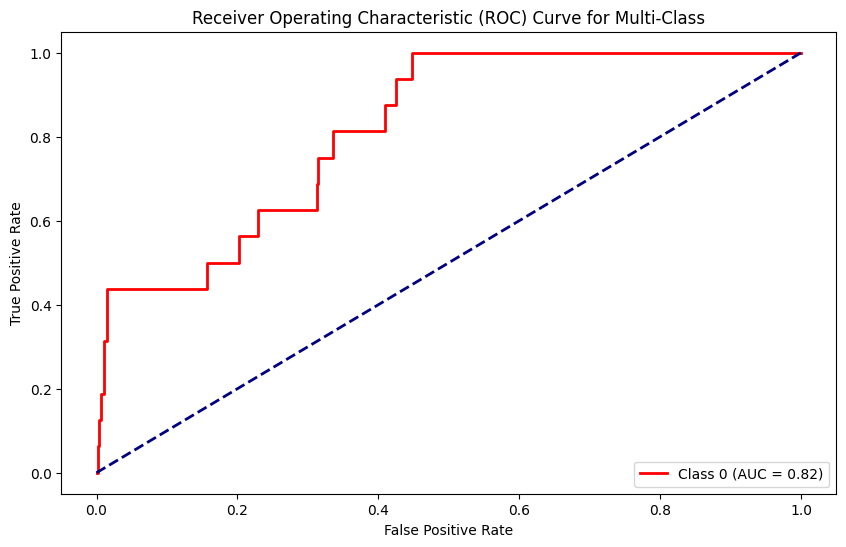

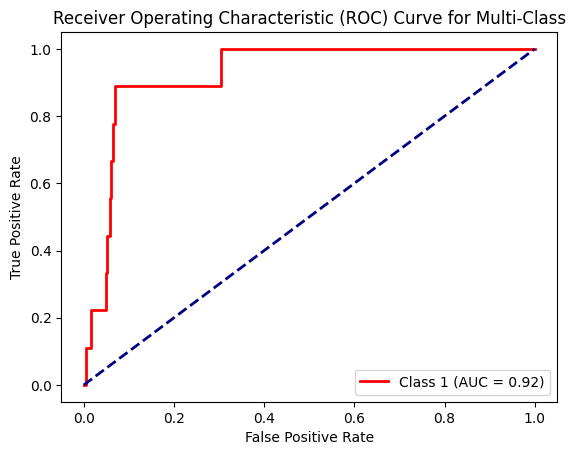

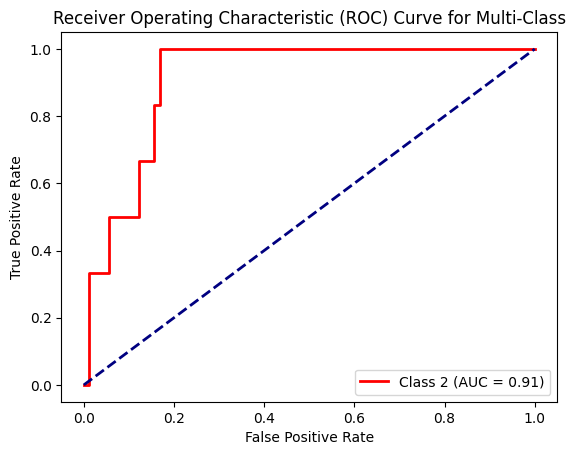

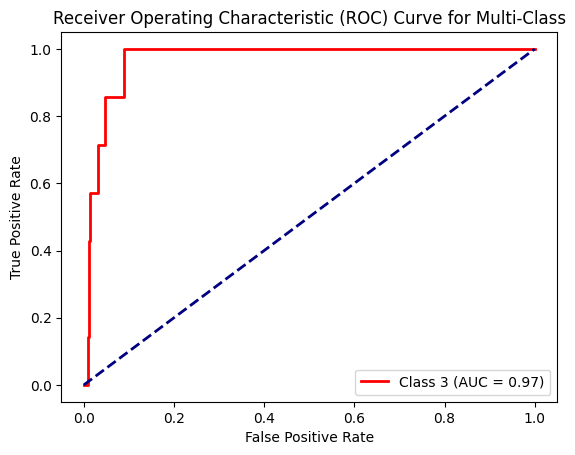

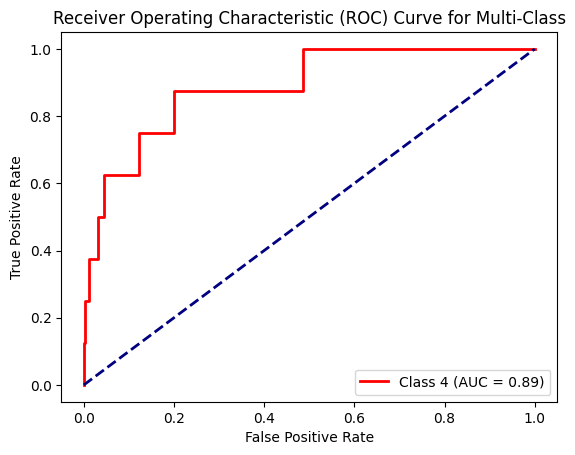

...

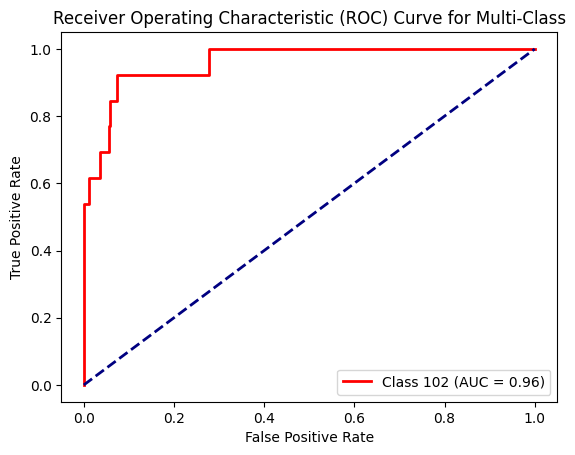

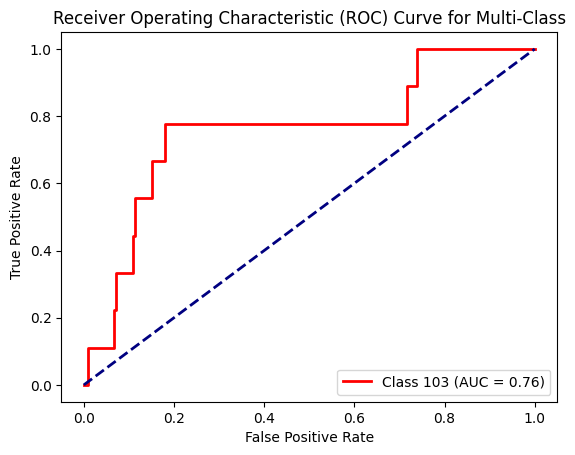

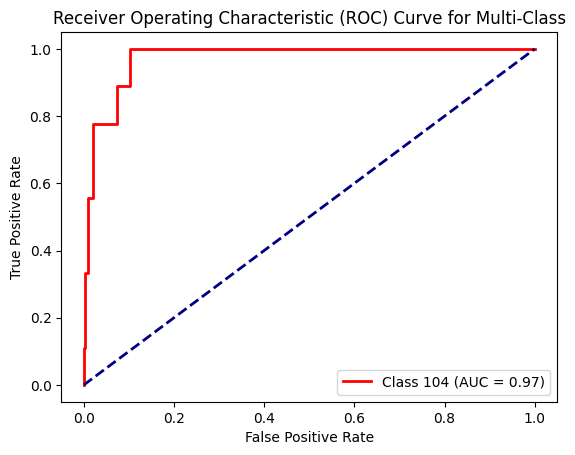

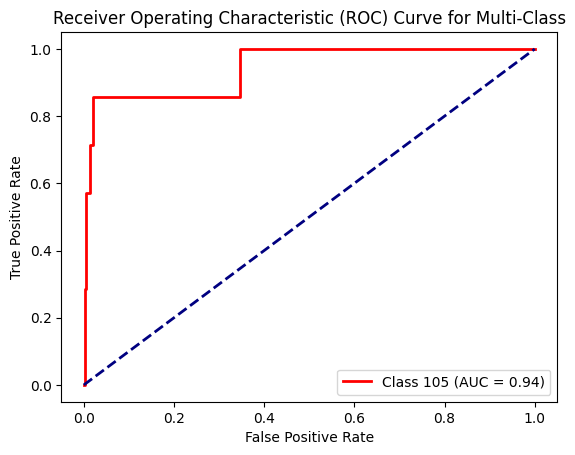

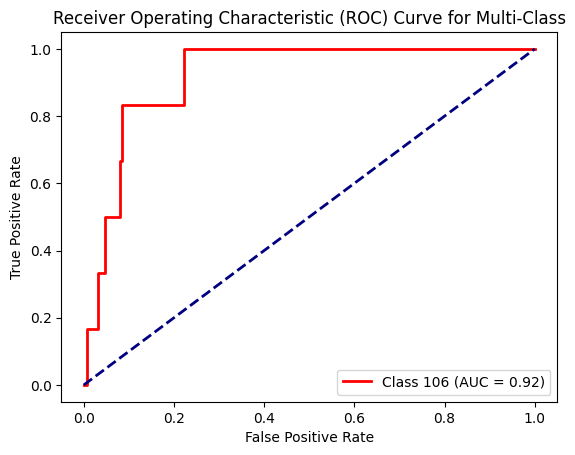

In [58]:
y_true = test_labels_one_hot
y_pred_prob = model.predict(test_data)

#fpr, tpr, thresholds = roc_curve(y_true, y_prob)
#roc_auc = auc(fpr, tpr)

# Initialize the OneVsRestClassifier
#classifier = OneVsRestClassifier(model)

# Calculate ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure(figsize=(10, 6)) # Add more colors as needed
for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], color='red', lw=2, label='Class {0} (AUC = {1:0.2f})'.format(i, roc_auc[i]))
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve for Multi-Class')
    plt.legend(loc="lower right")
    plt.show()

###### 2

26/26 [==============================] - 0s 14ms/step


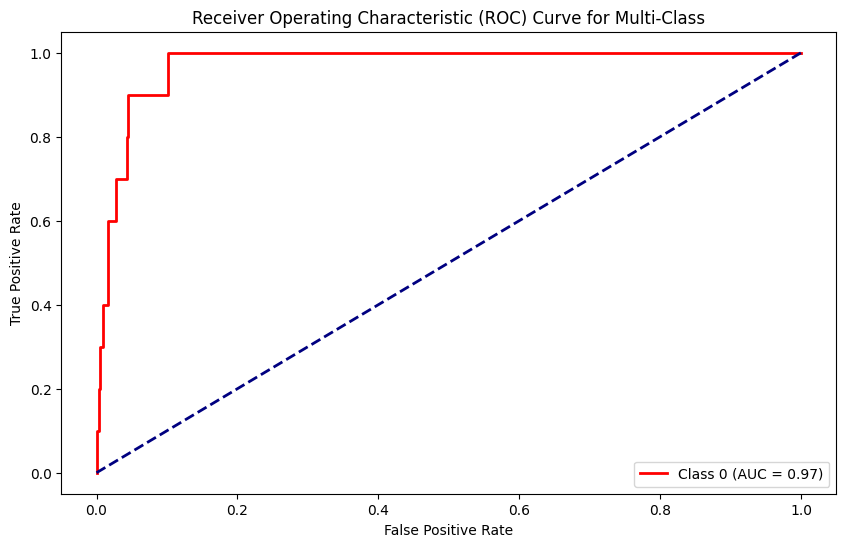

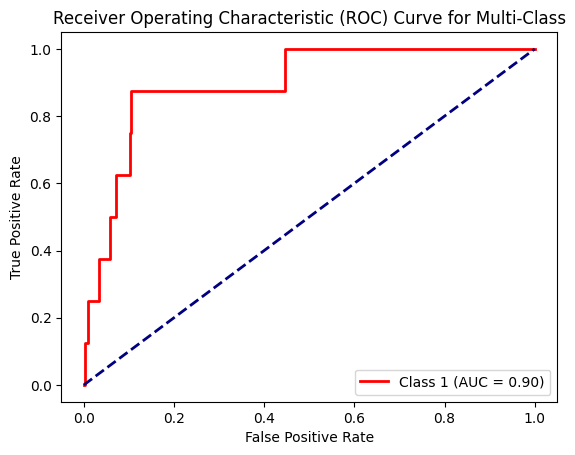

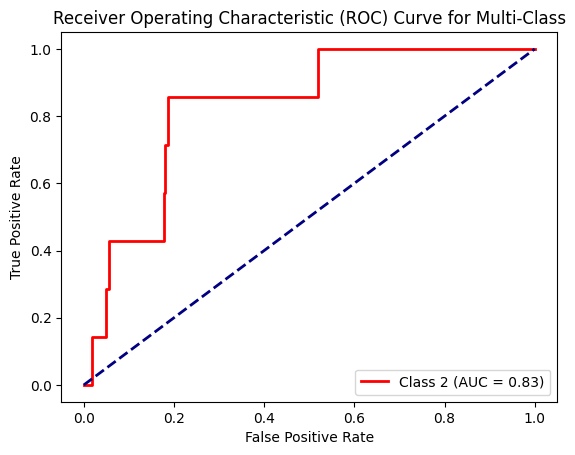

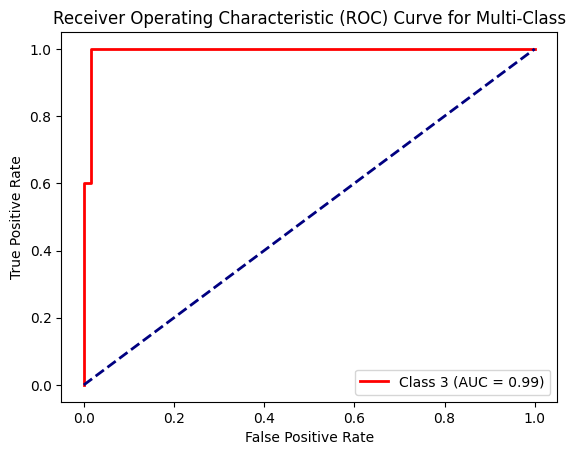

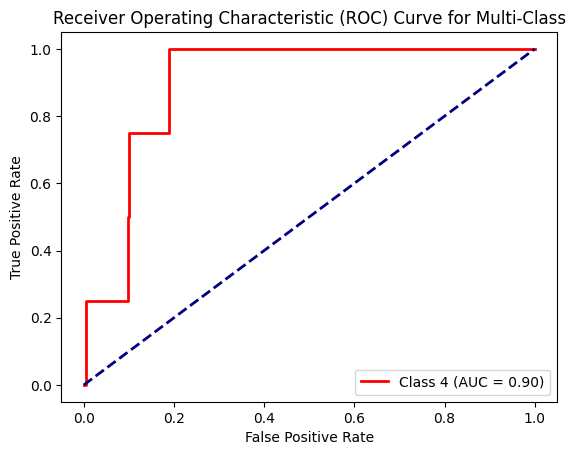

...

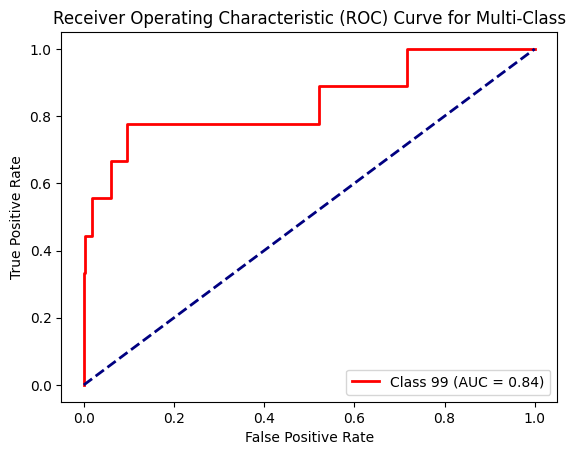

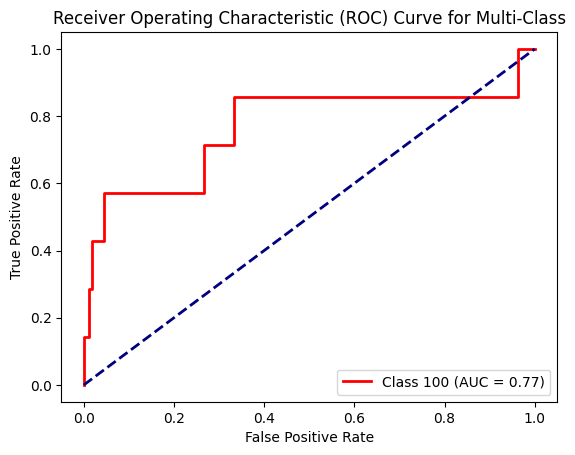

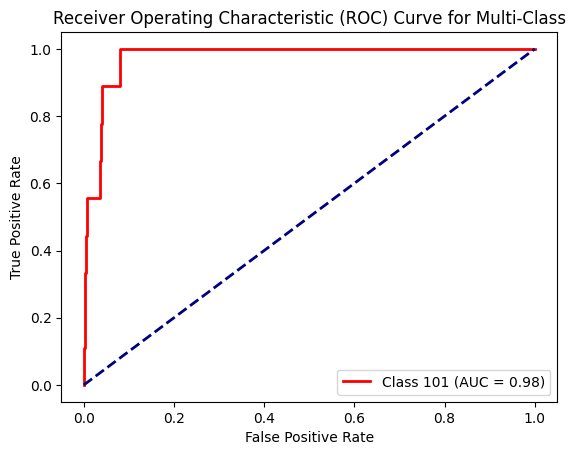

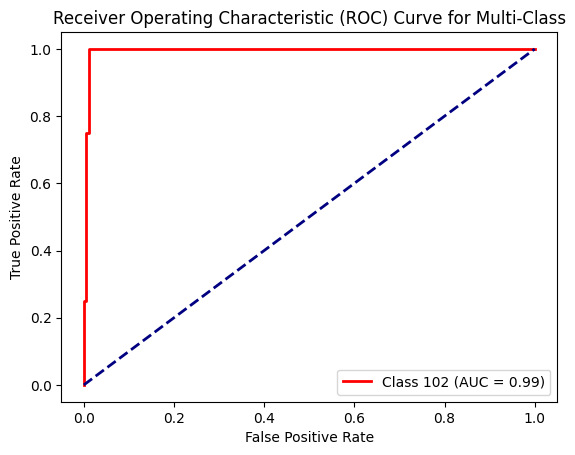

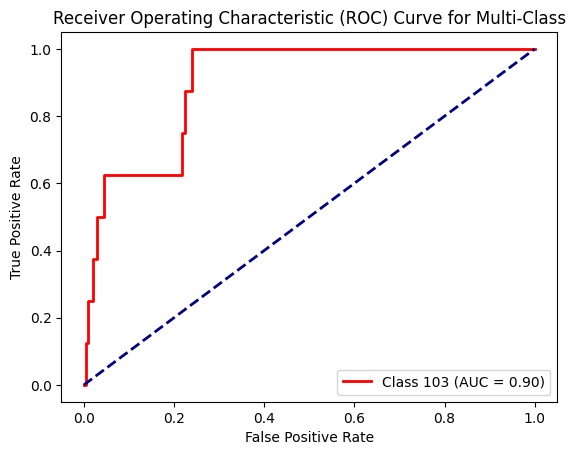

In [22]:
y_true = test_labels_one_hot
y_pred_prob = model.predict(test_data)

#fpr, tpr, thresholds = roc_curve(y_true, y_prob)
#roc_auc = auc(fpr, tpr)

# Initialize the OneVsRestClassifier
#classifier = OneVsRestClassifier(model)

# Calculate ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure(figsize=(10, 6)) # Add more colors as needed
for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], color='red', lw=2, label='Class {0} (AUC = {1:0.2f})'.format(i, roc_auc[i]))
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve for Multi-Class')
    plt.legend(loc="lower right")
    plt.show()

##### DenseNet

###### 1

In [23]:
model_file = '../models/param_iteration_dn.pkl' # pickle (pkl), .h5, ...
with open(model_file, 'rb') as f:
    model = pickle.load(f)

26/26 [==============================] - 7s 202ms/step


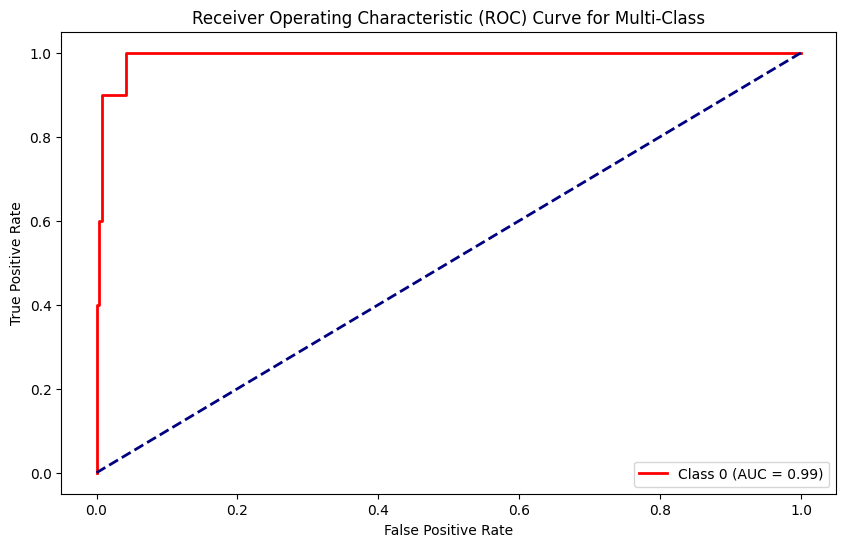

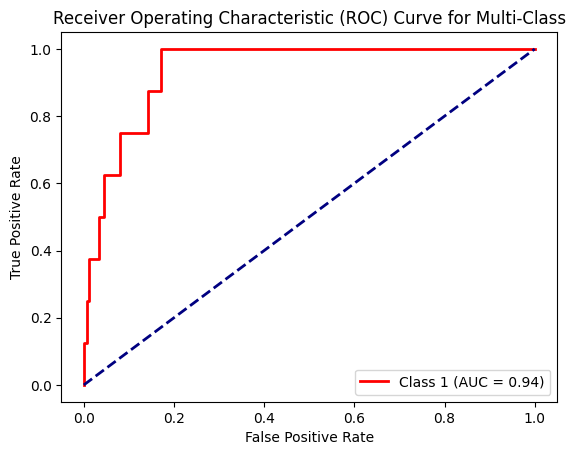

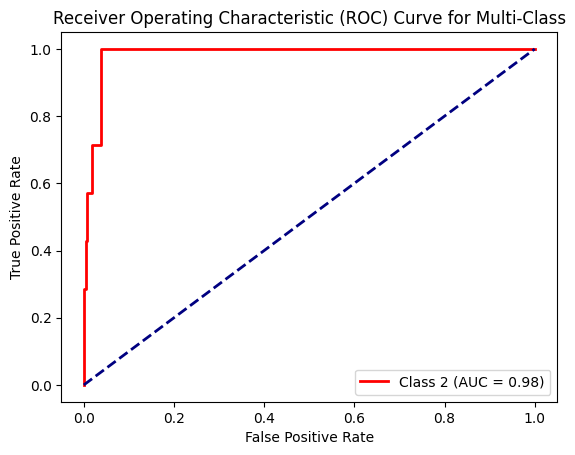

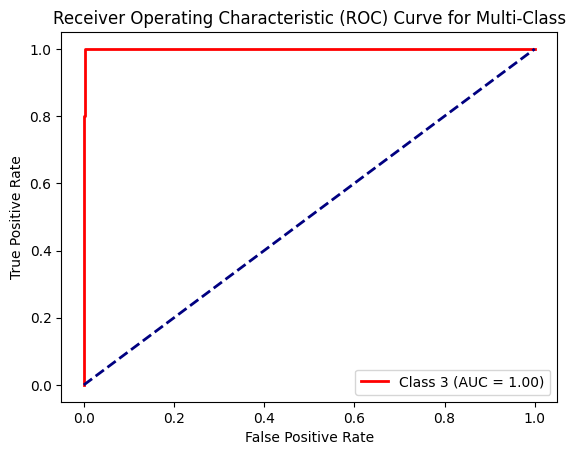

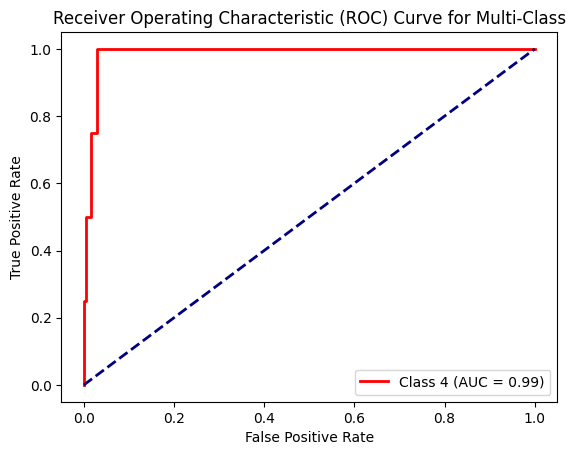

...

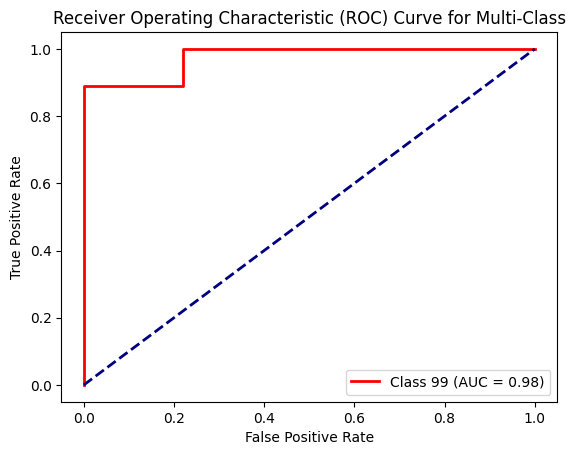

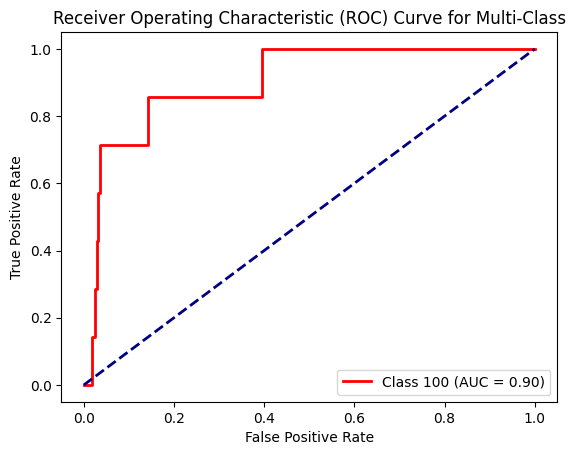

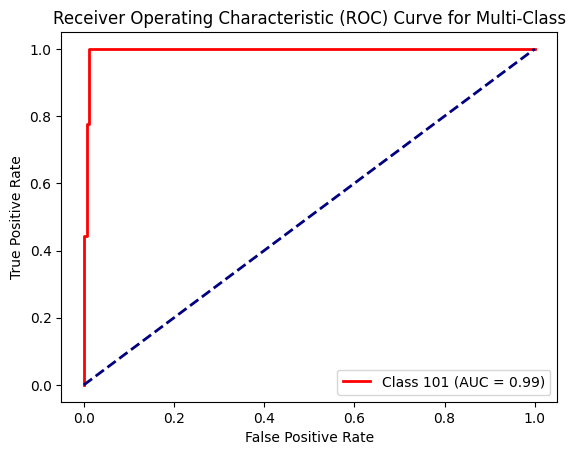

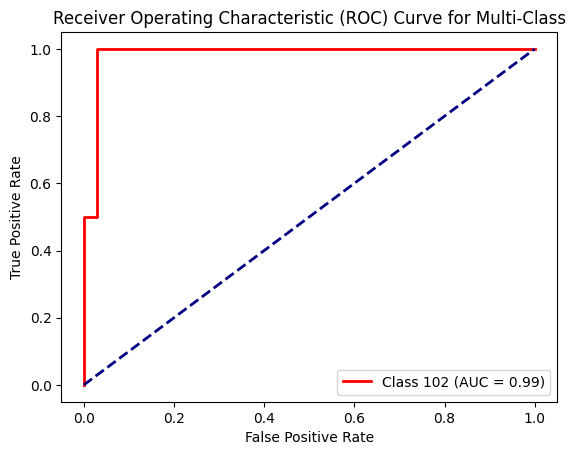

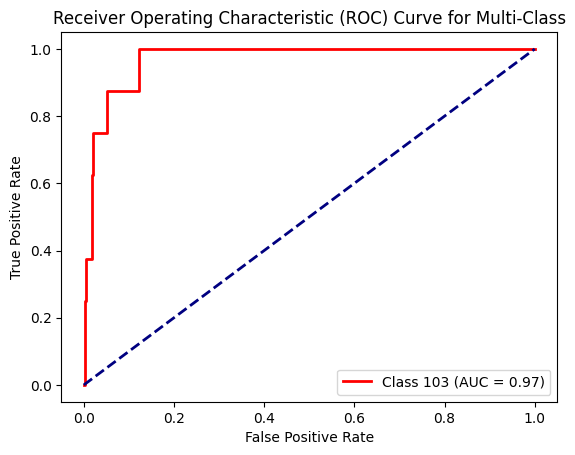

In [24]:
y_true = test_labels_one_hot
y_pred_prob = model.predict(test_data)

#fpr, tpr, thresholds = roc_curve(y_true, y_prob)
#roc_auc = auc(fpr, tpr)

# Initialize the OneVsRestClassifier
#classifier = OneVsRestClassifier(model)

# Calculate ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure(figsize=(10, 6)) # Add more colors as needed
for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], color='red', lw=2, label='Class {0} (AUC = {1:0.2f})'.format(i, roc_auc[i]))
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve for Multi-Class')
    plt.legend(loc="lower right")
    plt.show()

###### 2

In [15]:
model_file = '../models/param_iteration_dn.pkl' # pickle (pkl), .h5, ...
with open(model_file, 'rb') as f:
    model = pickle.load(f)

In [16]:
y_true = test_labels_one_hot
y_pred_prob = model.predict(test_data)

#fpr, tpr, thresholds = roc_curve(y_true, y_prob)
#roc_auc = auc(fpr, tpr)

# Initialize the OneVsRestClassifier
#classifier = OneVsRestClassifier(model)

# Calculate ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure(figsize=(10, 6)) # Add more colors as needed
for i in range(num_classes):
    plt.figsize 
    plt.plot(fpr[i], tpr[i], color='red', lw=2, label='Class {0} (AUC = {1:0.2f})'.format((i,labels_dict2[i]), roc_auc[i]))
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve for Multi-Class')
    plt.legend(loc="lower right")
    plt.show()

NameError: name 'test_labels_one_hot' is not defined

### Other

In [ ]:
def int_to_asana(n):
    lista=[]
    for el in n:
        l=[key for key, value in labels_dict.items() if value == el]
        lista.append(l[0])
    return lista


def compare(test data, test_labels_one_hot, model):
    lab_pred = model.predict(test_data)
    pred_labels = np.argmax(lab_pred, axis=1)

    test_labels = np.argmax(test_labels_one_hot, axis=1)

    #asana_pred = int_to_asana(labels_pred)
    #asana_test = int_to_asana(test_labels)
    #df = pd.DataFrame({'pred': asana_pred, 'true': asana_test}, index=range(len(asana_pred)))

#### Ways to improve the model:
- train set percentage
- data augmentation parameters
- num_layers and filters
- opt function and learning rate
- batch_size
- num_epochs + add early_stopping
- layer dense